In [57]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
import GraphHelpers as GH
import ETFunctions as et
import MathsUtilities as MUte

## Bring in the data needed

In [58]:
root = 'C:\GitHubRepos\CropWaterAnalysis'

In [59]:
#Bring in fPAR (estimated from NDVI and interpolated to daily values) for each plot
WheatfPAR = pd.concat([pd.read_pickle(root+'\Wheat\DataFrames\SplicedfPAR.pkl')],axis=1,keys=['Wheat'],names =['Crop'])
FodderBeetfPAR = pd.concat([pd.read_pickle(root+'\FodderBeet\DataFrames\SplicedfPAR.pkl')],axis=1,keys=['FodderBeet'],names =['Crop'])
LucernefPAR = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\LucDailyfPAREstInt.pkl')
RyegrassfPAR = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\RyeDailyfPAREstInt.pkl')
OatsfPAR = pd.concat([pd.read_pickle(root+'\Oats\DataFrames\SplicedfPAR.pkl')],axis=1,keys=['Oats'],names =['Crop'])
BarleyfPAR = pd.concat([pd.read_pickle(root+'\Barley\DataFrames\SplicedfPAR.pkl')],axis=1,keys=['Barley'],names =['Crop'])
fPAR = pd.concat([WheatfPAR,FodderBeetfPAR,LucernefPAR,RyegrassfPAR,OatsfPAR,BarleyfPAR],axis=1)
fPAR.dropna(how='all',inplace=True)
GH.SortFrame(fPAR)

In [60]:
#Bring in surface temperature for each plot and join up
WheatTs = pd.concat([pd.read_pickle(root+'\Wheat\DataFrames\DailyTs.pkl')],axis=1,keys=['Wheat'],names=['Crop'])
FodderBeetTs = pd.concat([pd.read_pickle(root+'\FodderBeet\DataFrames\DailyTs.pkl')],axis=1,keys=['FodderBeet'],names=['Crop'])
LucerneTs = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\LucDailyTs.pkl')
RyegrassTs = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\RyeDailyTs.pkl')
OatsTs = pd.concat([pd.read_pickle(root+'\Oats\DataFrames\DailyTs.pkl')],axis=1,keys=['Oats'],names=['Crop'])
BarleyTs = pd.concat([pd.read_pickle(root+'\Barley\DataFrames\DailyTs.pkl')],axis=1,keys=['Barley'],names=['Crop'])
Ts = pd.concat([WheatTs,FodderBeetTs,LucerneTs,RyegrassTs,OatsTs,BarleyTs],axis=1)
GH.SortFrame(Ts)
Ts.dropna(how='all',inplace=True)
Ts.drop_duplicates(inplace=True)

In [61]:
#Bring in air temperature data for each experiment
WheatTa = pd.read_pickle(root+'\Wheat\DataFrames\DailyTa.pkl')
FodderBeetTa = pd.read_pickle(root+'\FodderBeet\DataFrames\DailyTa.pkl')
LandPTa = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\DailyTa.pkl')
OatsTa = pd.read_pickle(root+'\Oats\DataFrames\DailyTa.pkl')
BarleyTa = pd.read_pickle(root+'\Barley\DataFrames\DailyTa.pkl')
Ta = pd.concat([WheatTa,FodderBeetTa,LandPTa,OatsTa,BarleyTa])
Ta.dropna(how='all',inplace=True)
Ta.drop_duplicates(inplace=True)
GH.SortFrame(Ta.reindex(fPAR.columns,axis=1))

In [62]:
#Bring in solar radiation data for each experiment
WheatRs = pd.read_pickle(root+'\Wheat\DataFrames\DailyRs.pkl')
FodderBeetRs = pd.read_pickle(root+'\FodderBeet\DataFrames\DailyRs.pkl')
LandPRs = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\DailyRs.pkl')
OatsRs = pd.read_pickle(root+'\Oats\DataFrames\DailyRs.pkl')
BarleyRs = pd.read_pickle(root+'\Barley\DataFrames\DailyRs.pkl')
Rs = pd.concat([WheatRs,FodderBeetRs,LandPRs,OatsRs,BarleyRs])
Rs.dropna(how='all',inplace=True)
Rs.drop_duplicates(inplace=True)
GH.SortFrame(Rs.reindex(fPAR.columns,axis=1))

In [63]:
#Bring in vapour pressure deficit for each experiment
WheatEd = pd.read_pickle(root+'\Wheat\DataFrames\DailyEd.pkl')
FodderBeetEd = pd.read_pickle(root+'\FodderBeet\DataFrames\DailyEd.pkl')
LandPEd = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\DailyEd.pkl')
OatsEd = pd.read_pickle(root+'\Oats\DataFrames\DailyEd.pkl')
BarleyEd = pd.read_pickle(root+'\Barley\DataFrames\DailyEd.pkl')
Ed = pd.concat([WheatEd,FodderBeetEd,LandPEd,OatsEd,BarleyEd])
Ed.dropna(how='all',inplace=True)
Ed.drop_duplicates(inplace=True)
GH.SortFrame(Ed)

In [64]:
#Bring in vapour pressure for each experiment
WheatEo = pd.read_pickle(root+'\Wheat\DataFrames\DailyEo.pkl')
FodderBeetEo = pd.read_pickle(root+'\FodderBeet\DataFrames\DailyEo.pkl')
LandPEo = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\DailyEo.pkl')
OatsEo = pd.read_pickle(root+'\Oats\DataFrames\DailyEo.pkl')
BarleyEo = pd.read_pickle(root+'\Barley\DataFrames\DailyEo.pkl')
Eo = pd.concat([WheatEo,FodderBeetEo,LandPEo,OatsEo,BarleyEo])
Eo.dropna(how='all',inplace=True)
Eo.drop_duplicates(inplace=True)
GH.SortFrame(Eo)

In [65]:
#Bring in net radiatin for each experiment
WheatRn = pd.concat([pd.read_pickle(root+'\Wheat\DataFrames\DailyRn.pkl')],axis=1,keys=['Wheat'],names=['Crop'])
FodderBeetRn = pd.concat([pd.read_pickle(root+'\FodderBeet\DataFrames\DailyRn.pkl')],axis=1,keys=['FodderBeet'],names=['Crop'])
LucRn = pd.concat([pd.read_pickle(root+'\LucerneAndPasture\DataFrames\LucDailyRn.pkl')],axis=1,keys=['Lucerne'],names=['Crop'])
RyeRn = pd.concat([pd.read_pickle(root+'\LucerneAndPasture\DataFrames\RyeDailyRn.pkl')],axis=1,keys=['Ryegrass'],names=['Crop'])
OatsRn = pd.concat([pd.read_pickle(root+'\Oats\DataFrames\DailyRn.pkl')],axis=1,keys=['Oats'],names=['Crop'])
BarleyRn = pd.concat([pd.read_pickle(root+'\Barley\DataFrames\DailyRn.pkl')],axis=1,keys=['Barley'],names=['Crop'])
Rn = pd.concat([WheatRn,FodderBeetRn,LucRn,RyeRn,OatsRn,BarleyRn],axis=1)
Rn.dropna(how='all',inplace=True)
Rn.drop_duplicates(inplace=True)
GH.SortFrame(Rn)

In [66]:
#Bring in soil water use data.
LucWU = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\LucDailyWU.pkl')
RyeWU = pd.read_pickle(root+'\LucerneAndPasture\DataFrames\RyeDailyWU.pkl')

WheatDaylightIndex = np.load(root+'\Wheat\DataFrames\DaylightIndex.npy')
# WheatHourlyWU = pd.read_pickle(root+'\Wheat\DataFrames\HourlyWUmm.pkl')
# WheatWU = pd.concat([WheatHourlyWU.reindex(WheatDaylightIndex).resample('d').sum()],axis=1,keys=['Wheat'],names=['Crop'])

FodderBeetDaylightIndex = np.load(root+'\FodderBeet\DataFrames\DaylightIndex.npy')
# FodderBeetHourlyWU = pd.read_pickle(root+'\FodderBeet\DataFrames\HourlyWUmm.pkl')
# FodderBeetWU = pd.concat([FodderBeetHourlyWU.reindex(FodderBeetDaylightIndex).resample('d').sum()],axis=1,keys=['FodderBeet'],names=['Crop'])

OatsDaylightIndex = np.load(root+'\Oats\DataFrames\DaylightIndex.npy')
# OatsHourlyWU = pd.read_pickle(root+'\Oats\DataFrames\HourlyWUmm.pkl')
# OatsWU = pd.concat([OatsHourlyWU.reindex(OatsDaylightIndex).resample('d').sum()],axis=1,keys=['Oats'],names=['Crop'])
# #OatsWU = pd.concat([pd.read_pickle(root+'\Oats\DataFrames\DailyWU.pkl')],axis=1,keys=['Oats'],names=['Crop'])

BarleyDaylightIndex = np.load(root+'\Barley\DataFrames\DaylightIndex.npy')
BarleyHourlyWU = pd.read_pickle(root+'\Barley\DataFrames\HourlyWUmm.pkl') 
BarleyWU = pd.concat([BarleyHourlyWU.reindex(BarleyDaylightIndex).resample('d').sum()],axis=1,keys=['Barley'],names=['Crop'])
#BarleyWU.columns = BarleyWU.columns.swaplevel('Irrigation','Cultivar')

RainShelterWU = pd.read_pickle(root+'/General/ET_Observations/DailyET.pkl')

WU = pd.concat([RainShelterWU,LucWU,RyeWU],axis=1)
WU.dropna(how='all',inplace=True)
GH.SortFrame(WU)

In [67]:
FirstUnion = list(set(Ts.index).intersection(Ta.index))
SecondUnion = list(set(FirstUnion).intersection(Rs.index))
ThirdUnion = list(set(SecondUnion).intersection(Ed.index))
ForthUnion = list(set(ThirdUnion).intersection(Eo.index))
FifthUnion = list(set(ForthUnion).intersection(Rn.index))
SixthUnion = list(set(FifthUnion).intersection(fPAR.index))
CommonDates = SixthUnion
CommonDates.sort()
Ts = Ts.reindex(CommonDates)
Ta = Ta.reindex(CommonDates)
Rs = Rs.reindex(CommonDates)
Ed = Ed.reindex(CommonDates)
Eo = Eo.reindex(CommonDates)
Rn = Rn.reindex(CommonDates)
fPAR = fPAR.reindex(CommonDates)

In [68]:
FirstUnion = list(set(Ts.columns).intersection(Rn.columns))
SecondUnion = list(set(FirstUnion).intersection(fPAR.columns))
ThirdUnion = list(set(SecondUnion).intersection(WU.columns))
CommonPlots = ThirdUnion
Ts = Ts.reindex(CommonPlots,axis=1)
Rn = Rn.reindex(CommonPlots,axis=1)
fPAR = fPAR.reindex(CommonPlots,axis=1)
WU = WU.reindex(CommonPlots,axis=1)

In [69]:
WU = WU.loc[np.min(CommonDates):,CommonPlots].dropna(how='all').copy()

In [70]:
Crops = Ts.columns.get_level_values(0).drop_duplicates().values
Crops.sort()
WheatGPs = GH.SetGraphicsPatterns(Ts.Wheat.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['orange','green','purple'])

FodderBeetGPs = GH.SetGraphicsPatterns(Ts.FodderBeet.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['orange','green','purple'])

LucerneGPs = GH.SetGraphicsPatterns(Ts.loc[:,['Lucerne','Ryegrass']].columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['red','blue','green','orange'],InvertLevels=True)

RyegrassGPs = GH.SetGraphicsPatterns(Ts.loc[:,['Lucerne','Ryegrass']].columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['red','blue','green','orange'],InvertLevels=True)

OatsGPs = GH.SetGraphicsPatterns(Ts.Oats.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['purple','green','orange'])
BarleyGPs = GH.SetGraphicsPatterns(Ts.Barley.columns,
                    ['--','-'],
                    [0.45,0.15],
                    ['^','o'],
                    ['red','blue'])

Irrigation
['Irrigated', 'Dryland']
Nitrogen
['50', '250', '0']
Treatments
MultiIndex(levels=[['Dryland', 'Irrigated'], ['0', '250', '50']],
           labels=[[1, 1, 1, 0, 0, 0], [2, 1, 0, 2, 1, 0]])
Styles
[('-', 'orange', 0.15, 'o'), ('-', 'green', 0.15, 'o'), ('-', 'purple', 0.15, 'o'), ('--', 'orange', 0.45, '^'), ('--', 'green', 0.45, '^'), ('--', 'purple', 0.45, '^')]
StyleFrame
              Lin     Col   Alp Mar     MFC
Irrigated 50    -  orange  0.15   o  orange
          250   -   green  0.15   o   green
          0     -  purple  0.15   o  purple
Dryland   50   --  orange  0.45   ^   white
          250  --   green  0.45   ^   white
          0    --  purple  0.45   ^   white
Irrigation
['Irrigated', 'Dryland']
Nitrogen
['50', '0', '300']
Treatments
MultiIndex(levels=[['Dryland', 'Irrigated'], ['0', '300', '50']],
           labels=[[1, 1, 1, 0, 0, 0], [2, 0, 1, 2, 0, 1]])
Styles
[('-', 'orange', 0.15, 'o'), ('-', 'green', 0.15, 'o'), ('-', 'purple', 0.15, 'o'), ('--', 'ora

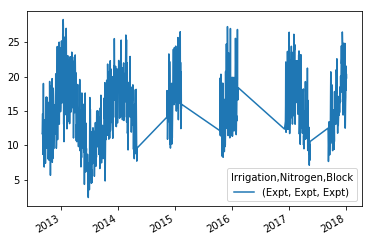

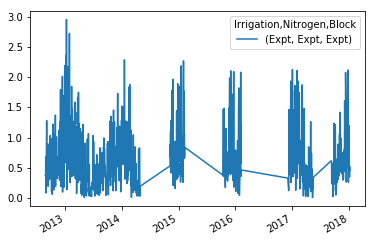

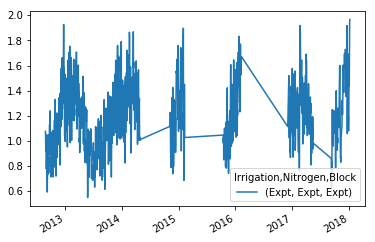

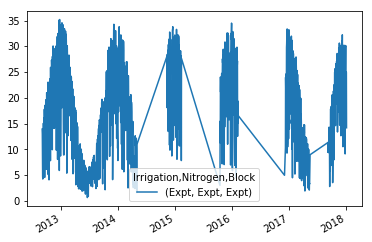

In [71]:
Ta.loc[CommonDates,:].plot()
Ed.loc[CommonDates,:].plot()
Eo.loc[CommonDates,:].plot()
Rs.loc[CommonDates,:].plot()

In [72]:
Ts.Barley.dropna().index

DatetimeIndex(['2014-11-08', '2014-11-09', '2014-11-10', '2014-11-11',
               '2014-11-12', '2014-11-13', '2014-11-14', '2014-11-15',
               '2014-11-16', '2014-11-17', '2014-11-18', '2014-11-19',
               '2014-11-20', '2014-11-21', '2014-11-22', '2014-11-23',
               '2014-11-24', '2014-11-25', '2014-11-26', '2014-11-27',
               '2014-11-28', '2014-11-29', '2014-11-30', '2014-12-01',
               '2014-12-02', '2014-12-03', '2014-12-04', '2014-12-05',
               '2014-12-06', '2014-12-07', '2014-12-08', '2014-12-09',
               '2014-12-10', '2014-12-11', '2014-12-12', '2014-12-13',
               '2014-12-14', '2014-12-15', '2014-12-16', '2014-12-17',
               '2014-12-18', '2014-12-19', '2014-12-20', '2014-12-21',
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31', '2015-01-01', '2015-01-02',
      

In [73]:
Ts.columns.get_level_values(0).drop_duplicates().values

array(['Oats', 'Lucerne', 'FodderBeet', 'Wheat', 'Barley', 'Ryegrass'],
      dtype=object)

In [74]:
def MakeTimeSeriesGraphs(Data,name,ymin,ymax):
    Graph = plt.figure(figsize=(18,30))
    Crops = Data.columns.get_level_values(0).drop_duplicates().values
    Crops.sort()
    pos = 1
    for C in Crops:
        GP = globals()[C+'GPs']
        ax = Graph.add_subplot(3,2,pos)
        GH.AddIndexedPlot(Data.reindex(CommonDates).loc[:,C].where(Data.loc[:,C].reindex(CommonDates)!=0,np.nan).dropna(how='all'),ax,GP,2)
        plt.ylabel(name, fontsize=36);
        plt.ylim(ymin,ymax)
        plt.tick_params(labelsize=20)
        plt.title(C, fontsize=28)
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y'))
        GH.AddLegend(1,16,'')
        pos+=1
def MakeSingleCropTimeSeries(Data,Crop):
    graph = plt.figure(figsize=(18,18))
    ax = graph.add_subplot(1,1,1)
    GP = globals()[Crop+'GPs']
    GH.AddIndexedPlot(Data.reindex(CommonDates).loc[:,Crop].dropna(how='all'),ax,GP,2)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


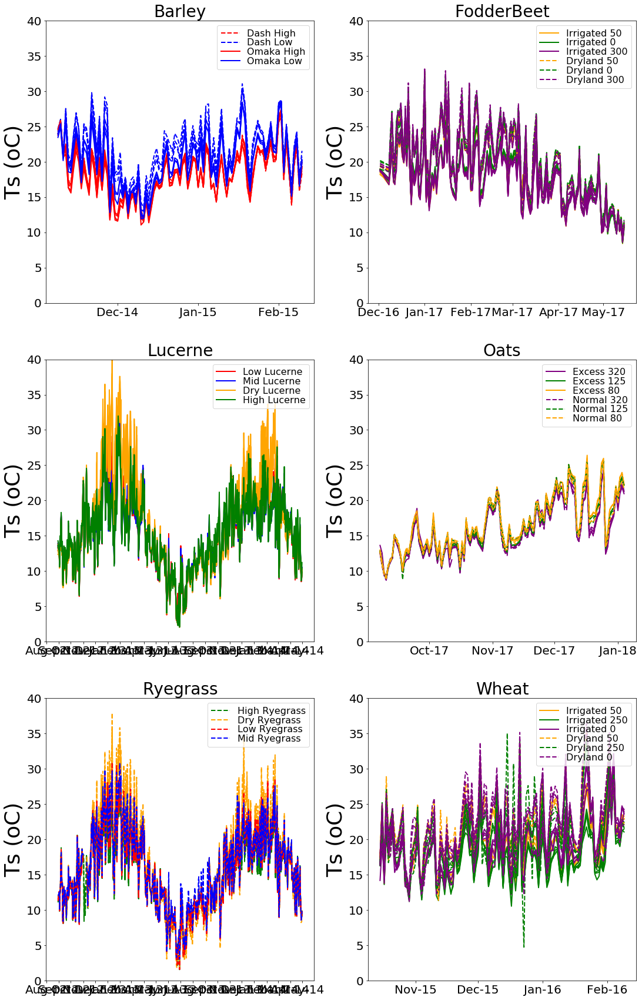

In [75]:
MakeTimeSeriesGraphs(Ts,'Ts (oC)',0,40)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


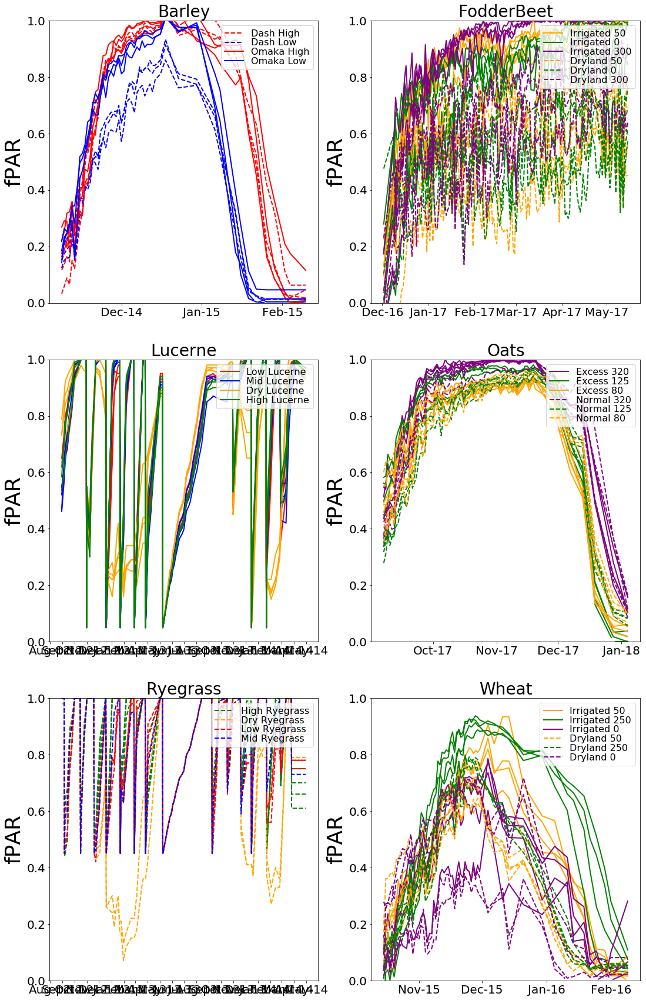

In [76]:
MakeTimeSeriesGraphs(fPAR,'fPAR',0,1)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


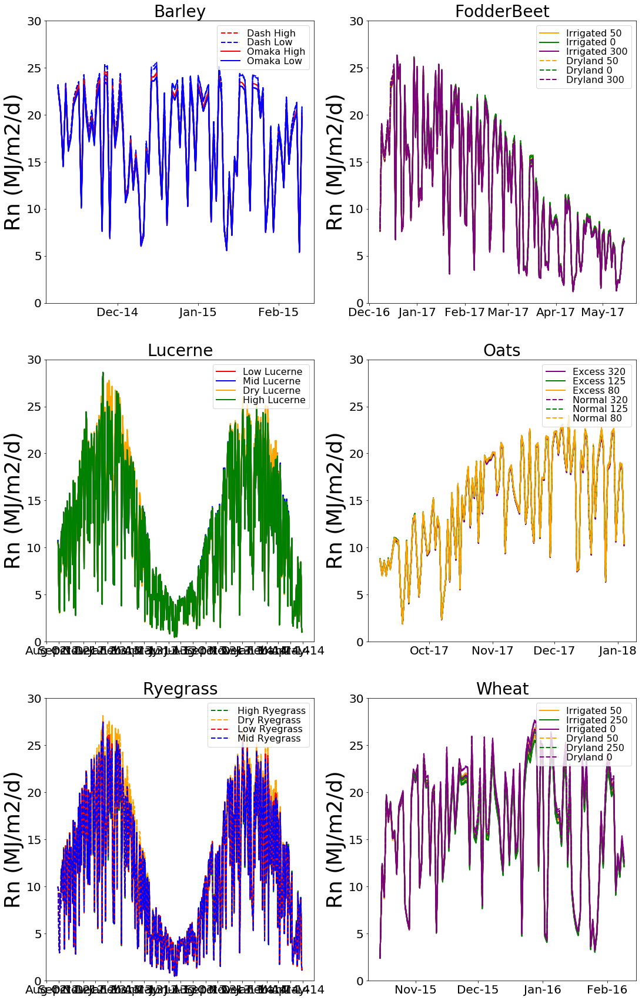

In [77]:
MakeTimeSeriesGraphs(Rn,'Rn (MJ/m2/d)',0,30)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


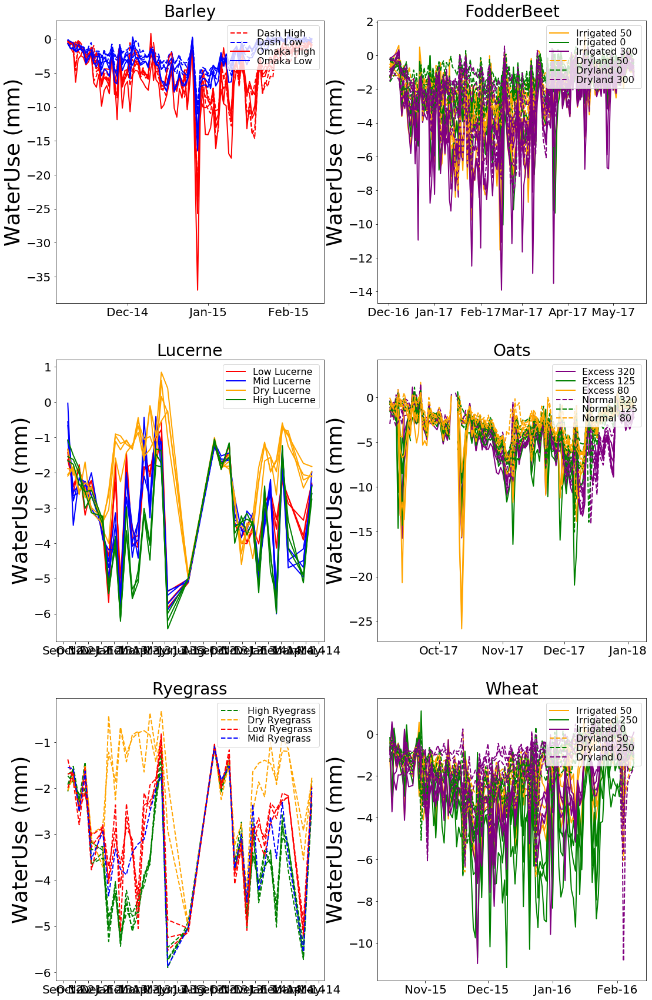

In [78]:
MakeTimeSeriesGraphs(WU,'WaterUse (mm)',None,None)

## Calculates estimates of G and subtract from Rn

In [79]:
def estGDay(SoilRadn, AirTemp):
    Const = -0.6319
    SoilRadEff = np.multiply(SoilRadn.values,0.0801)
    AirTempEff = np.multiply(AirTemp.values,0.0659)
    return Const + SoilRadEff  + AirTempEff 

#Calculate G for each plot
G = pd.DataFrame(index=CommonDates, columns=Ts.columns)
for plot in G.columns:
    G.loc[:,plot] = estGDay(Rs.loc[CommonDates,('Expt','Expt','Expt')] * (1-fPAR.loc[CommonDates,plot]),
                            Ta.loc[CommonDates,('Expt','Expt','Expt')])
RnLessG = Rn - G

## Calculate estimates of E

In [80]:
#Calculate aerodynamic temperature
To = pd.DataFrame(index = CommonDates,columns=Ts.columns)
for plot in To.columns:
    To.loc[:,plot] = Ts.loc[CommonDates,plot] + Ed.loc[CommonDates,('Expt','Expt','Expt')].values
    
#Calculate temperature difference
Td = pd.DataFrame(index = CommonDates,columns=Ts.columns)
for plot in Td.columns:
    Td.loc[:,plot] = To.loc[CommonDates,plot] - Ta.loc[CommonDates,('Expt','Expt','Expt')].values

#Calculate alpha
def AlphaCoeff(Td,fPAR):
    Td = max(Td,-2.5)
    CoverFact = 0.1+1.6*fPAR
    if CoverFact > 1.0:
        CoverFact = 1.0
    return 1.3 * np.exp(Td*-0.13) * CoverFact

Alpha = pd.DataFrame(index = CommonDates,columns=Ts.columns)
for plot in Alpha.columns:
    Alpha.loc[:,plot] = [AlphaCoeff(Td.loc[x,plot],
                                   fPAR.loc[x,plot]) for x in Alpha.index]

#Estimate Water Use by surfaces 
E = pd.DataFrame(index = CommonDates,columns=Ts.columns)
for plot in E.columns:
    E.loc[:,plot] = [et.Priestly_TaylorEO(RnLessG.loc[x,plot],
                                         Ta.loc[x,('Expt','Expt','Expt')],
                                         Alpha.loc[x,plot],
                                         'net') for x in E.index]

In [81]:
RnLessG.to_pickle('RnLessG.pkl')
fPAR.to_pickle('fPAR.pkl')
Ta.to_pickle('Ta.pkl')
Ed.to_pickle('Ed.pkl')
Ts.to_pickle('Ts.pkl')
WU.to_pickle('WU.pkl')

In [82]:
with open('CommonDates.txt', 'w') as filehandle:
    for date in CommonDates:
        filehandle.write('%s\n' % date)

## Remove dates where we don't want to compare to measure WU because data is missing or on days of irrigation

In [83]:
#Create a list of time to exclude where data was missing or irrigation was applied
BarleyNoMeasurementDates = ['2014-12-26','2014-12-27','2014-12-28']
BarleyIrrigationDates = ['2014-11-11','2014-11-18','2014-11-26','2014-12-02','2014-12-10','2014-12-16',
                    '2014-12-23','2014-12-30','2015-01-06','2015-01-13','2015-01-14']
WheatIrrigationDates = ['2015-11-26', '2016-01-21', '2016-01-07', '2015-11-12',
                         '2015-12-24', '2015-11-19', '2015-12-17', '2016-02-04',
                         '2015-11-06', '2015-12-31', '2015-10-13', '2015-11-02',
                         '2016-01-14', '2015-10-29', '2015-12-03', '2015-10-30',
                         '2015-12-10', '2016-02-03']
FodderBeetIrrigationDates = ['2017-01-18',
                             '2017-03-08', '2017-03-01', '2017-05-30', '2017-01-25',
                             '2016-11-23', '2016-12-07', '2017-05-26', '2017-05-25',
                             '2017-02-01', '2017-02-08', '2017-03-22', '2017-02-22',
                             '2016-12-29', '2017-04-27', '2017-01-04', '2016-11-16',
                             '2017-04-12', '2017-02-15', '2017-05-29', '2017-01-11',
                             '2016-12-21']
OatsIrrigationDates = ['2017-12-06', '2017-12-13', '2017-09-13', '2017-11-22',
                        '2017-10-11', '2017-09-12', '2017-09-11', '2017-10-10',
                        '2017-10-12', '2017-08-28', '2017-11-06', '2017-11-29',
                        '2017-11-15','2017-09-12', '2017-09-13', '2017-09-17', 
                        '2017-10-06','2017-10-11', '2017-10-12', '2017-10-14',
                        '2017-10-25','2017-12-06', '2017-12-09', '2017-12-26',
                        '2018-01-04']
LandPExclusionDates = ['2013-05-08', '2013-06-26']
ExclusionDates = pd.to_datetime(BarleyIrrigationDates + \
                 WheatIrrigationDates + \
                 FodderBeetIrrigationDates + \
                 OatsIrrigationDates + \
                 BarleyNoMeasurementDates + \
                 LandPExclusionDates)

UseDates = [x not in ExclusionDates for x in E.index]
E = E.loc[UseDates,:]

WUUseDates = [x not in ExclusionDates for x in WU.index]
WU = WU.loc[WUUseDates,:]

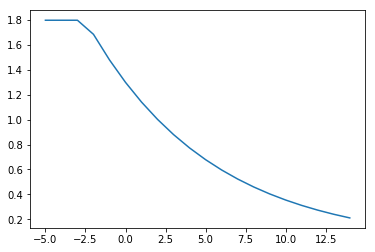

In [84]:
temprange = range(-5,15)
alphas = [AlphaCoeff(x,1.0) for x in temprange]
plt.plot(temprange,alphas)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


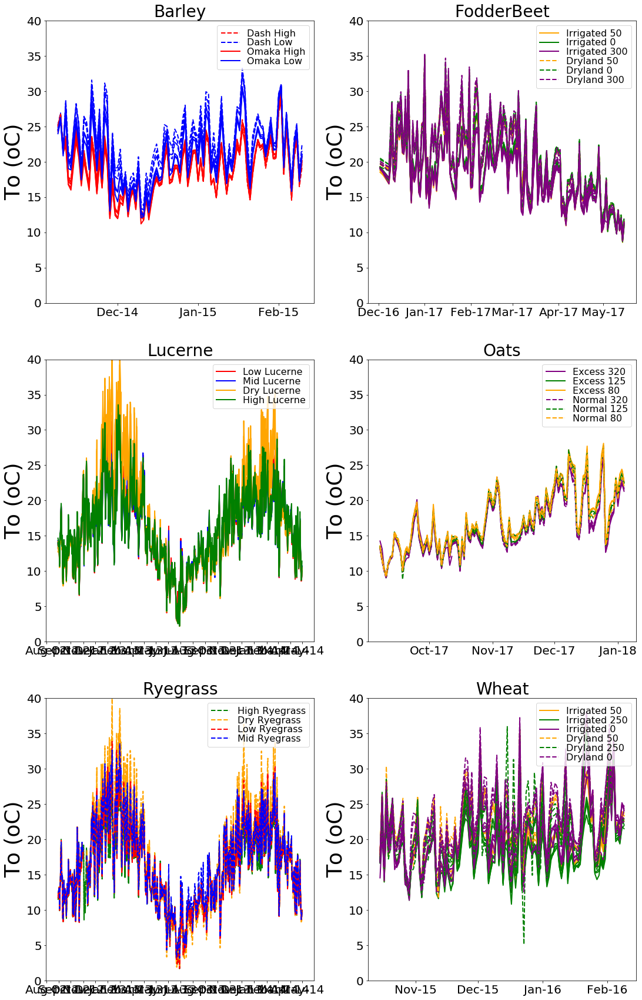

In [85]:
MakeTimeSeriesGraphs(To,'To (oC)',0,40)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


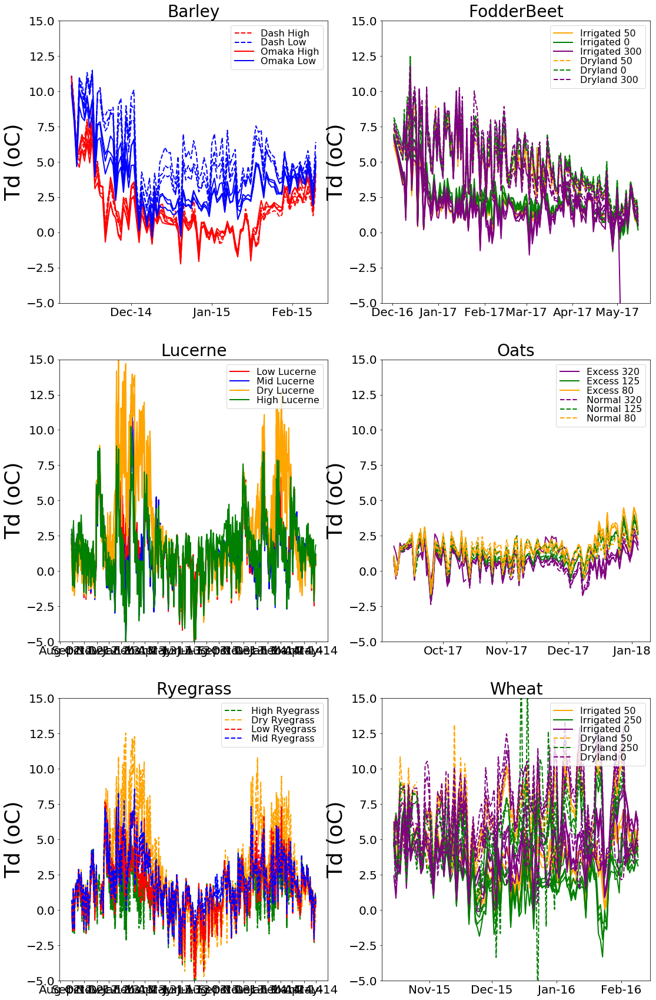

In [86]:
MakeTimeSeriesGraphs(Td,'Td (oC)',-5,15)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


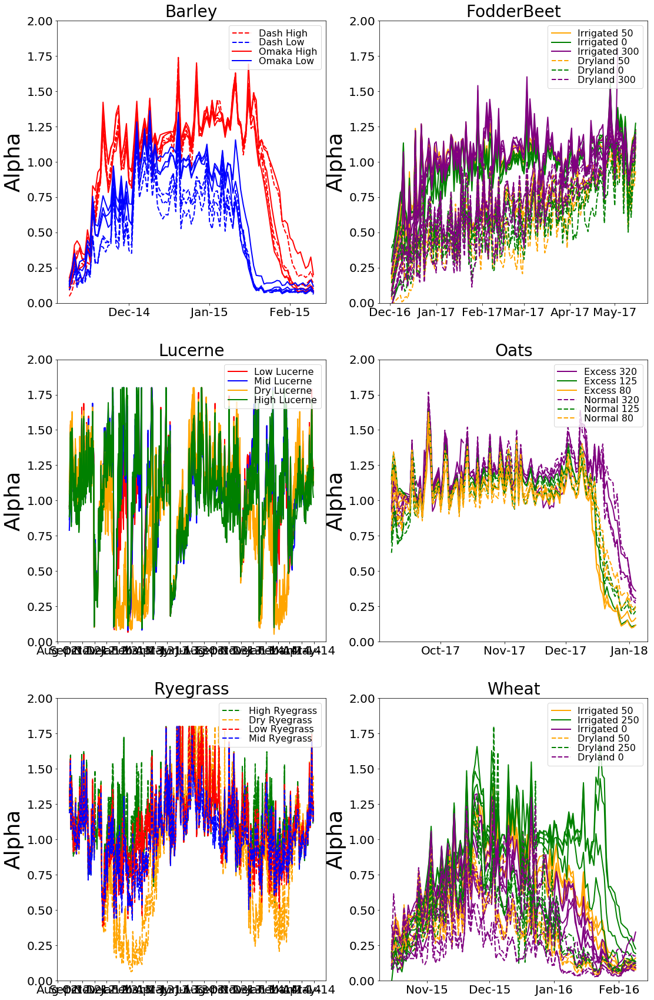

In [87]:
MakeTimeSeriesGraphs(Alpha,'Alpha',0,2)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


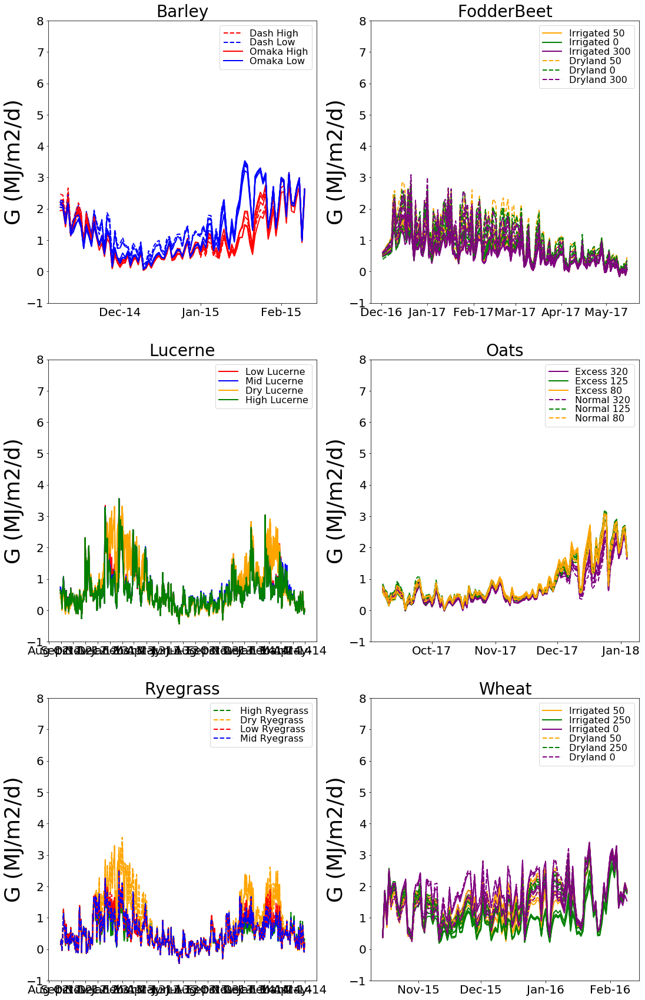

In [88]:
MakeTimeSeriesGraphs(G,'G (MJ/m2/d)',-1,8)

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


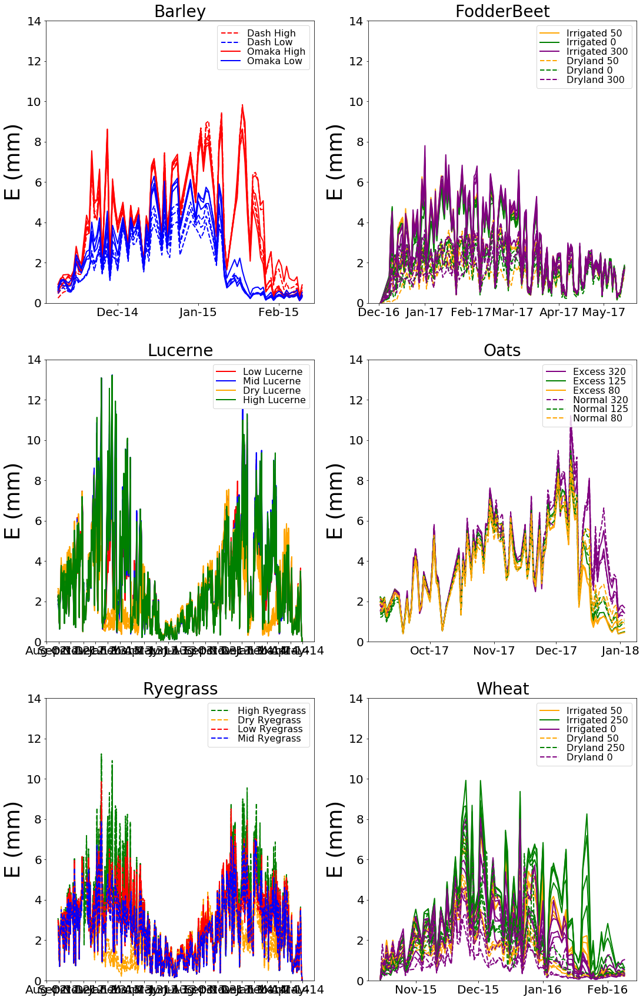

In [89]:
MakeTimeSeriesGraphs(E,'E (mm)',0,14)

## Agregate daily E estimates up to the same period as WU measurements

In [90]:
MeanPeriodE = WU.copy()
MeanPeriodE.loc[:,:] = np.nan
GH.SortFrame(MeanPeriodE)
for c in Crops:
    Dates = WU.loc[:,c].dropna(how='all').index
    for d in range(1,len(Dates)):
        for plot in MeanPeriodE.loc[:,c].columns:
            MeanPeriodE.loc[Dates[d],(c,plot)] = E.loc[Dates[d-1]+datetime.timedelta(days=1):Dates[d],(c,plot)].mean()        

In [91]:
MeanPeriodE.loc[:,'Barley'].dropna().groupby(level=['Irrigation','Nitrogen'],axis=1).mean()

Irrigation      Dash               Omaka          
Nitrogen        High       Low      High       Low
2014-11-08  0.449284  0.551062  0.759178  0.690282
2014-11-09  0.674302  0.786960  1.045150  1.065822
2014-11-10  0.734063  0.882435  1.217591  1.147641
2014-11-12  0.951155  0.636965  1.201845  0.856149
2014-11-13  0.950992  0.549516  1.140066  0.848423
2014-11-14  1.219853  0.741595  1.421947  1.230366
2014-11-15  2.044086  1.292288  2.391232  2.196746
2014-11-16  1.713316  1.046109  1.816262  1.898894
2014-11-17  1.586037  1.112455  1.676585  1.624817
2014-11-19  3.812503  1.395596  3.943117  2.326386
2014-11-20  3.506375  1.707155  3.656543  2.397971
2014-11-21  6.785610  2.416911  7.174434  3.606211
2014-11-22  4.339180  1.837370  4.819176  2.737863
2014-11-23  4.385917  2.249028  4.776245  3.080672
2014-11-24  5.809411  2.664245  6.166616  3.773970
2014-11-25  2.003002  1.504268  2.060246  1.692388
2014-11-27  8.171049  2.750095  8.393741  4.031900
2014-11-28  1.483779  1.156019  1.554351  1.312605
2014-11-29  5.663692  2.499149  5.863453  3.495231
2014-11-30  4.525300  2.305722  4.675723  3.073384
2014-12-01  3.588242  1.758067  3.822701  2.555879
2014-12-03  4.682773  3.879868  4.839044  4.106185
2014-12-04  3.711216  3.163267  3.757796  3.369594
2014-12-05  2.716444  2.200832  2.875011  2.506730
2014-12-06  4.613783  3.746803  4.736055  4.174953
2014-12-07  3.817017  3.090319  3.827011  3.521113
2014-12-08  4.101016  3.245287  4.210582  3.663473
2014-12-09  4.633804  3.759967  4.563968  4.203649
2014-12-11  1.847136  1.608067  1.914797  1.779978
2014-12-12  4.103070  3.056237  4.151069  3.678477
...              ...       ...       ...       ...
2015-01-10  9.297138  3.515880  8.973563  4.480634
2015-01-11  3.221411  1.498212  3.166564  1.712403
2015-01-12  1.707065  0.849441  1.688133  0.969279
2015-01-15  4.609310  1.346566  4.546755  1.511964
2015-01-16  5.589791  1.158127  5.656632  1.202228
2015-01-17  8.093021  1.211623  8.114633  1.479299
2015-01-18  9.256256  0.830452  8.939675  1.033552
2015-01-19  8.065982  0.577375  7.738221  0.739368
2015-01-20  4.914307  0.404343  4.477396  0.525034
2015-01-21  2.497449  0.254369  2.357046  0.276337
2015-01-22  5.747556  0.449163  5.467326  0.504732
2015-01-23  5.316281  0.478963  5.285622  0.565519
2015-01-24  4.711121  0.482648  4.756239  0.590701
2015-01-25  3.326916  0.392404  3.477498  0.507502
2015-01-26  3.107546  0.464676  3.349022  0.610033
2015-01-27  0.924451  0.157806  0.946004  0.198296
2015-01-28  1.237838  0.235258  1.263215  0.297457
2015-01-29  1.579213  0.312275  1.524649  0.410513
2015-01-30  0.543852  0.139064  0.558021  0.166663
2015-01-31  0.971988  0.289619  1.021771  0.364544
2015-02-01  1.084051  0.367415  1.191098  0.453842
2015-02-02  0.762815  0.352666  0.953005  0.408391
2015-02-03  0.473450  0.239587  0.558345  0.298191
2015-02-04  0.737538  0.415019  0.907706  0.490445
2015-02-05  0.519376  0.300569  0.623183  0.350165
2015-02-06  0.588784  0.315335  0.613048  0.407272
2015-02-07  0.642584  0.333994  0.623155  0.411554
2015-02-08  0.764731  0.414684  0.742496  0.512889
2015-02-09  0.202042  0.121364  0.203182  0.141764
2015-02-10  0.621198  0.319435  0.538030  0.401350

[81 rows x 4 columns]

C:\Anaconda\lib\site-packages\pandas\core\indexing.py:1472: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


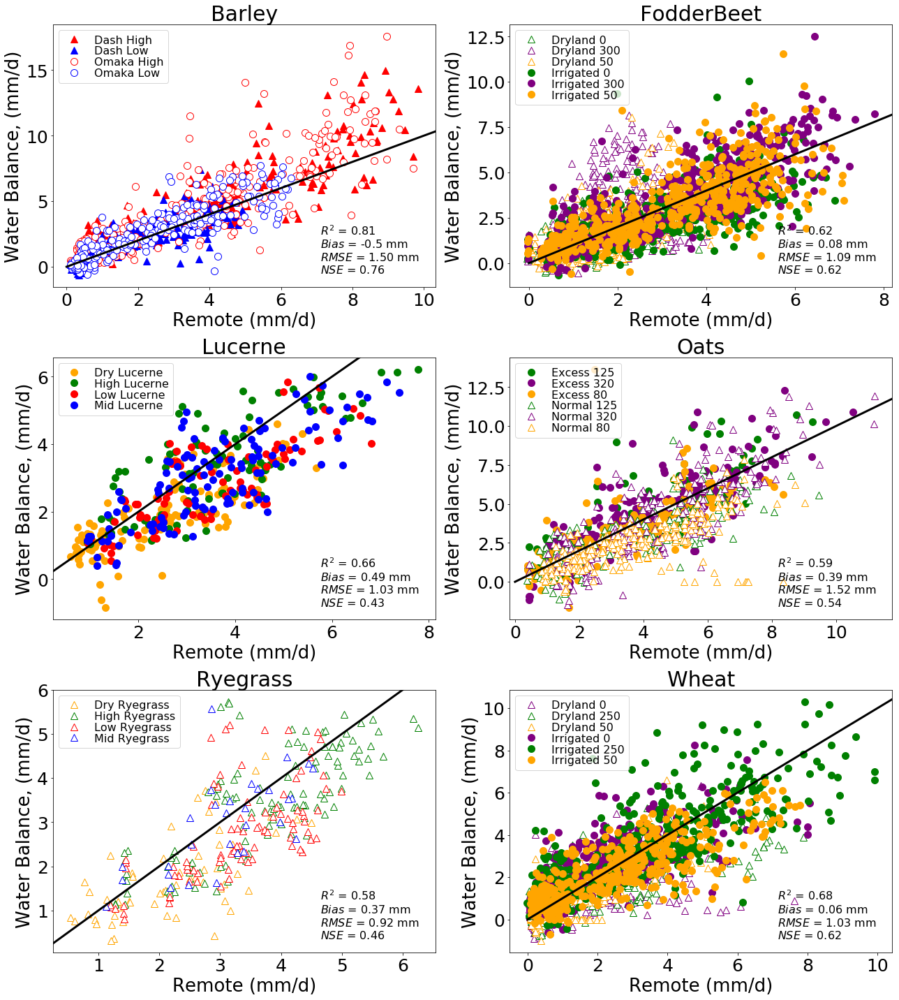

In [92]:
Graph = plt.figure(figsize=(18,20))
pos =  1
for crop in Crops:
        ax = Graph.add_subplot(3,2,pos)
        GH.AddIndexedXY(MeanPeriodE.loc[:,crop],
                        -WU.reindex(MeanPeriodE.index).loc[:,crop],
                        ax,globals()[crop+'GPs'], 10)
        GH.SetAxProps(crop,30,'Water Balance, (mm/d)','Remote (mm/d)',26,25)
        GH.AddLegend(2,16,"")
        Y = MeanPeriodE.loc[:,crop].stack().stack().stack()
        X = -1 * WU.loc[:,crop].stack().stack().stack().reindex(Y.index)
        RegStats = MUte.MathUtilities.CalcRegressionStats('ET',Y,X)
        Xs = []
        Xs.append(X.min())
        Xs.append(X.max())
        Ys = []
        Ys.append(RegStats.Intercept + Xs[0]*RegStats.Slope)
        Ys.append(RegStats.Intercept + Xs[1]*RegStats.Slope)
        plt.plot([0,13],[0,13],'-', linewidth = 3, color='k')
        fitR2 = r'$R^2$ = ' + str(RegStats.R2)[:4]\
            + '\n$Bias$ = ' + str(RegStats.ME)[:4] + ' mm' \
            + '\n$RMSE$ = ' + str(RegStats.RMSE)[:4] + ' mm'\
            + '\n$NSE$ = ' + str(RegStats.NSE)[:4] +''
        plt.text(.7,.05,fitR2,fontsize=16,transform=ax.transAxes)
        pos +=1
plt.tight_layout()    

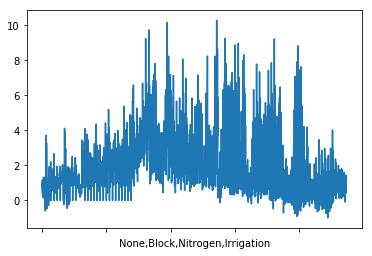

In [93]:
X.plot()

In [94]:
MUte.MathUtilities.CalcRegressionStats(str(1.3)+' '+str(0.13)+' '+str(1.0)+' '+c,Y,X).NSE

0.6253894053209321

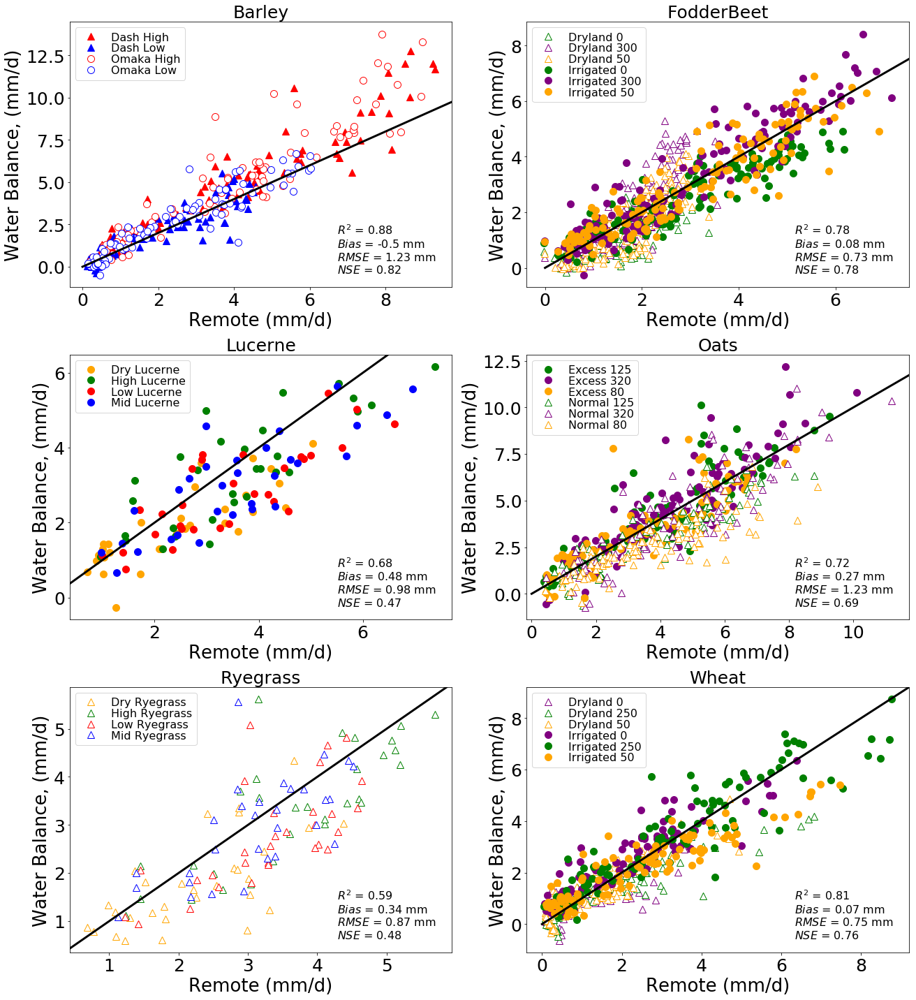

In [95]:
Graph = plt.figure(figsize=(18,20))
pos =  1
for crop in Crops:
        ax = Graph.add_subplot(3,2,pos)
        F1 = WU.loc[:,crop].columns.get_level_values(0).name
        F2 = WU.loc[:,crop].columns.get_level_values(1).name
        GH.AddIndexedXY(MeanPeriodE.loc[:,crop].groupby(level=[F1,F2],axis=1).mean(),
                        -WU.reindex(MeanPeriodE.index).loc[:,crop].groupby(level=[F1,F2],axis=1).mean(),
                        ax,globals()[crop+'GPs'], 10)
        GH.SetAxProps(crop,25,'Water Balance, (mm/d)','Remote (mm/d)',26,25)
        GH.AddLegend(2,16,"")
        Y = MeanPeriodE.loc[:,crop].groupby(level=[F1,F2],axis=1).mean().stack().stack()
        X = -1 * WU.loc[:,crop].groupby(level=[F1,F2],axis=1).mean().stack().stack().reindex(Y.index)
        RegStats = MUte.MathUtilities.CalcRegressionStats('ET',Y,X)
        Xs = []
        Xs.append(X.min())
        Xs.append(X.max())
        Ys = []
        Ys.append(RegStats.Intercept + Xs[0]*RegStats.Slope)
        Ys.append(RegStats.Intercept + Xs[1]*RegStats.Slope)
        plt.plot([0,13],[0,13],'-', linewidth = 3, color='k')
        fitR2 = r'$R^2$ = ' + str(RegStats.R2)[:4]\
            + '\n$Bias$ = ' + str(RegStats.ME)[:4] + ' mm' \
            + '\n$RMSE$ = ' + str(RegStats.RMSE)[:4] + ' mm'\
            + '\n$NSE$ = ' + str(RegStats.NSE)[:4] +''
        plt.text(.7,.05,fitR2,fontsize=16,transform=ax.transAxes)
        
        pos +=1
plt.tight_layout()    

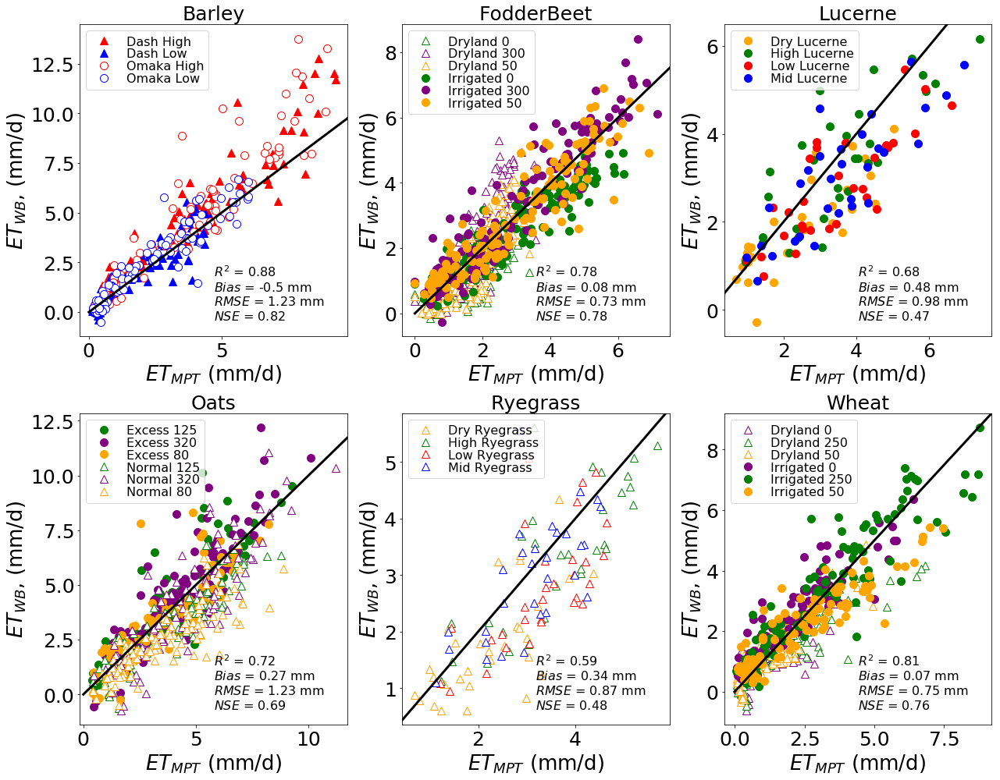

In [96]:
Graph = plt.figure(figsize=(18,14))
pos =  1
for crop in Crops:
        ax = Graph.add_subplot(2,3,pos)
        F1 = WU.loc[:,crop].columns.get_level_values(0).name
        F2 = WU.loc[:,crop].columns.get_level_values(1).name
        GH.AddIndexedXY(MeanPeriodE.loc[:,crop].groupby(level=[F1,F2],axis=1).mean(),
                        -WU.reindex(MeanPeriodE.index).loc[:,crop].groupby(level=[F1,F2],axis=1).mean(),
                        ax,globals()[crop+'GPs'], 10)
        GH.SetAxProps(crop,25,'$ET_{WB}$, (mm/d)','$ET_{MPT}$ (mm/d)',26,25)
        GH.AddLegend(2,16,"")
        Y = MeanPeriodE.loc[:,crop].groupby(level=[F1,F2],axis=1).mean().stack().stack()
        X = -1 * WU.loc[:,crop].groupby(level=[F1,F2],axis=1).mean().stack().stack().reindex(Y.index)
        RegStats = MUte.MathUtilities.CalcRegressionStats('ET',Y,X)
        Xs = []
        Xs.append(X.min())
        Xs.append(X.max())
        Ys = []
        Ys.append(RegStats.Intercept + Xs[0]*RegStats.Slope)
        Ys.append(RegStats.Intercept + Xs[1]*RegStats.Slope)
        plt.plot([0,13],[0,13],'-', linewidth = 3, color='k')
        fitR2 = r'$R^2$ = ' + str(RegStats.R2)[:4]\
            + '\n$Bias$ = ' + str(RegStats.ME)[:4] + ' mm' \
            + '\n$RMSE$ = ' + str(RegStats.RMSE)[:4] + ' mm'\
            + '\n$NSE$ = ' + str(RegStats.NSE)[:4] +''
        plt.text(.5,.05,fitR2,fontsize=16,transform=ax.transAxes)
        
        pos +=1
plt.tight_layout()    


In [97]:
MeanPeriodE.groupby(level=['Crop','Irrigation','Nitrogen'],axis=1).mean().to_excel('EstimatedE.xls')

In [98]:
WU.multiply(-1).groupby(level=['Crop','Irrigation','Nitrogen'],axis=1).mean().to_excel('MeasuredE.xls')

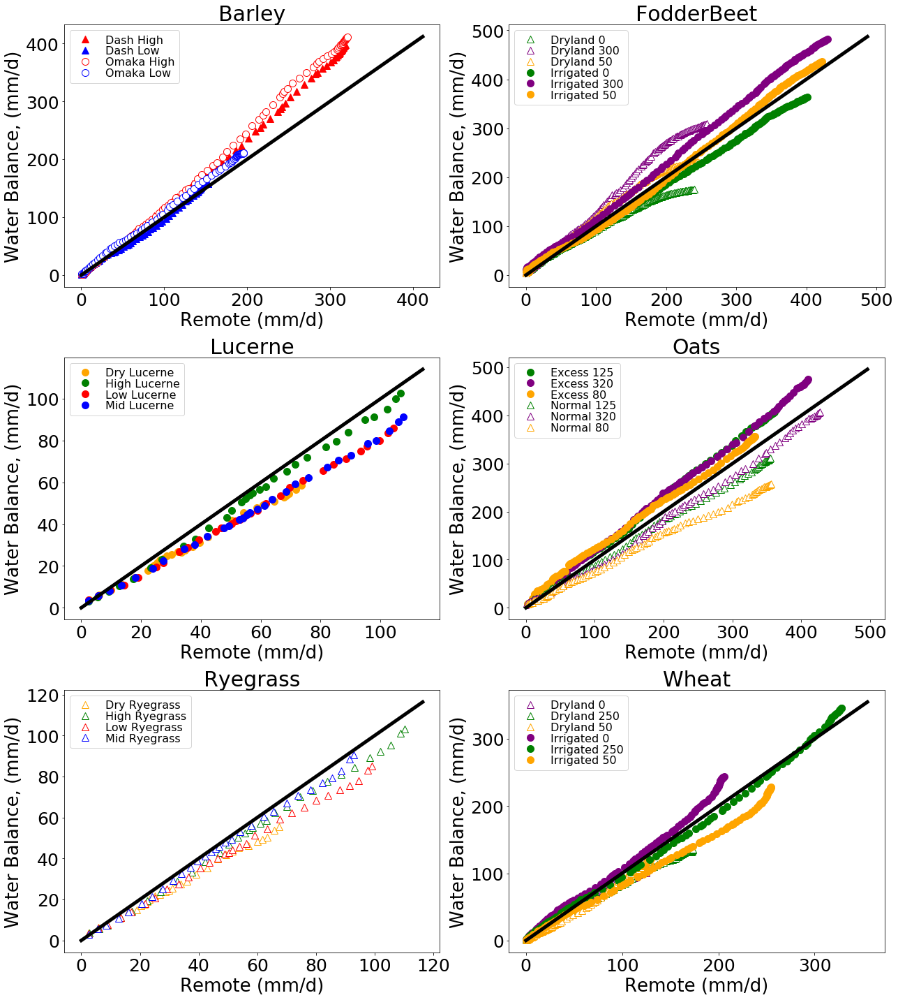

In [99]:
Graph = plt.figure(figsize=(18,20))
pos =  1
for crop in Crops:
        ax = Graph.add_subplot(3,2,pos)
        F1 = WU.loc[:,crop].columns.get_level_values(0).name
        F2 = WU.loc[:,crop].columns.get_level_values(1).name
        WaterUse = -WU.reindex(MeanPeriodE.index).loc[:,crop].groupby(level=[F1,F2],axis=1).mean()
        GH.AddIndexedXY(MeanPeriodE.loc[:,crop].groupby(level=[F1,F2],axis=1).mean().cumsum(),
                        WaterUse.cumsum(),
                        ax,globals()[crop+'GPs'], 10)
        ymax = max(MeanPeriodE.loc[:,crop].cumsum().max().max(),
                  WaterUse.cumsum().max().max())
        plt.plot([0,ymax],[0,ymax],'k',lw=5)
        plt.ylabel('Water Balance, (mm/d)',fontsize=26)
        plt.xlabel('Remote (mm/d)',fontsize=26)
        plt.tick_params(labelsize=25)
        plt.title(crop,fontsize=30)
        #plt.ylim(-0,15)
        labels, handles = GH.DedupLegendElements()
        ledg = plt.legend(labels, handles,loc=2,numpoints=1,fontsize = 16,labelspacing = 0.05)
        ledg.get_title().set_fontsize(20)
        pos +=1
plt.tight_layout()    

## Calculate and graph residules

In [100]:
Residules = np.divide(np.subtract(MeanPeriodE, -WU),-WU)

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


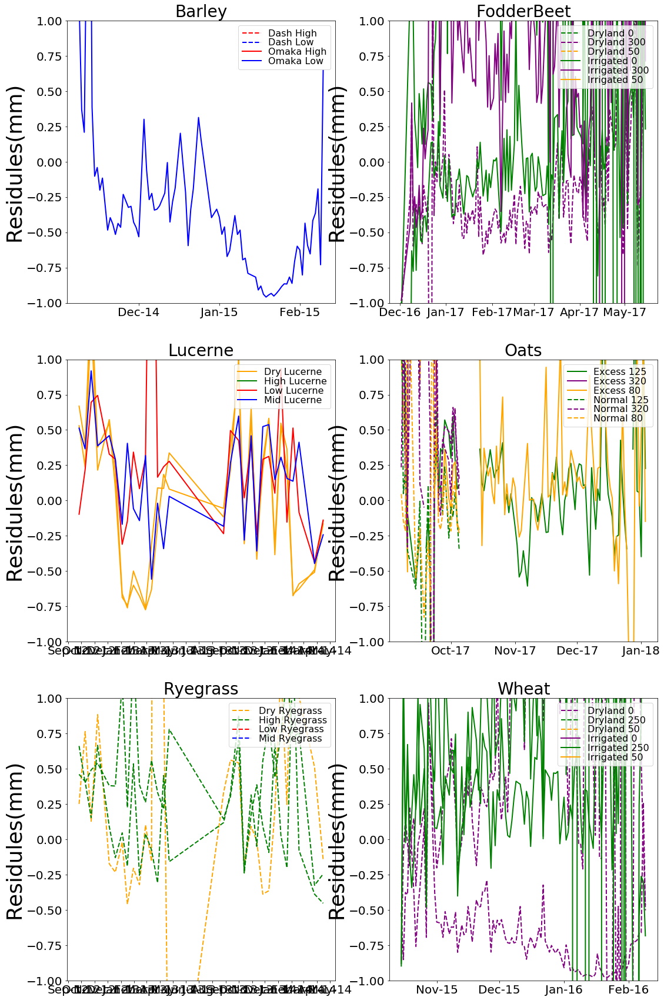

In [101]:
MakeTimeSeriesGraphs(Residules,'Residules(mm)',-1,1)

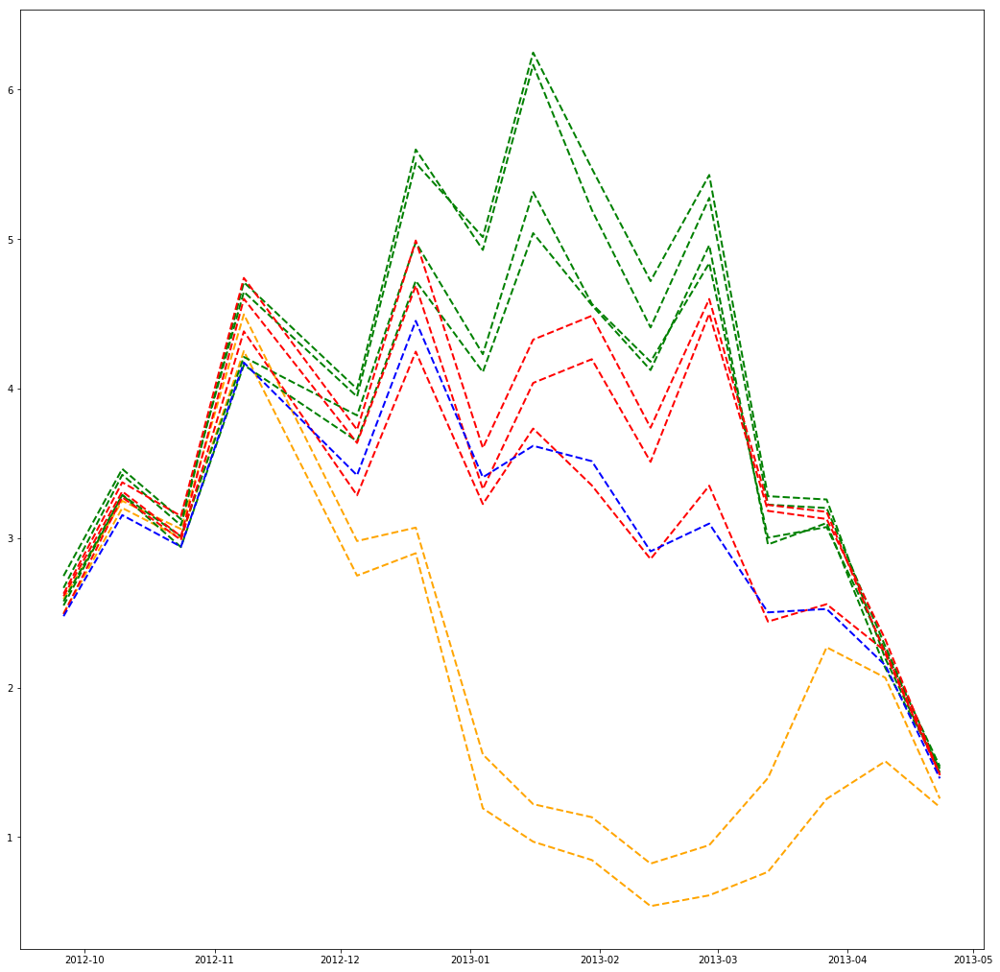

In [102]:
MakeSingleCropTimeSeries(MeanPeriodE.loc[:'2013-07-01',:],'Ryegrass')

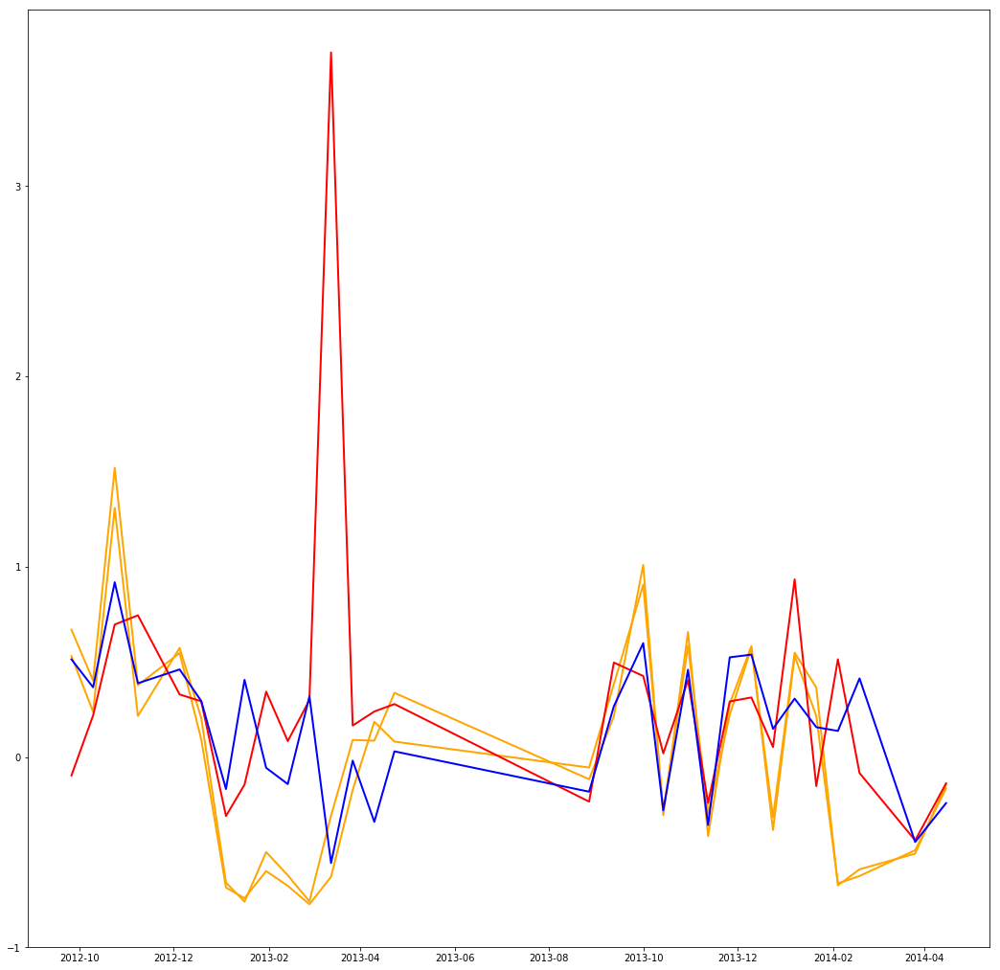

In [103]:
MakeSingleCropTimeSeries(Residules.loc[:,:],'Lucerne')

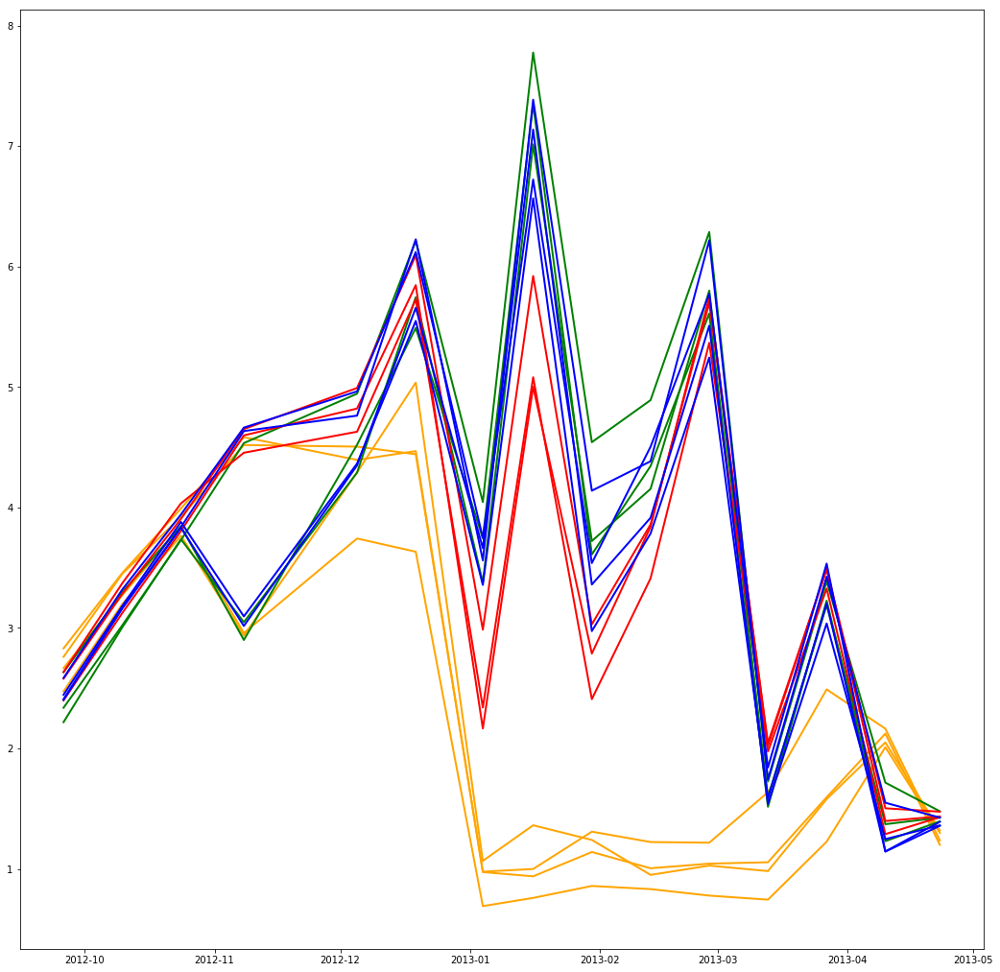

In [104]:
MakeSingleCropTimeSeries(MeanPeriodE.loc[:'2013-07-01',:],'Lucerne')